<a href="https://colab.research.google.com/github/Ankur-singh/GANs/blob/main/notebooks/06_CycleGANs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cycle GANs

This is an important paper that solve the major issue with Pix2Pix model. Let me give you some context so that you can appreciate it as well.

### What is Image Translation?
Image-to-image translation involves generating a new synthetic version of a given image with a specific modification, such as translating a summer landscape to winter. Image-to-image translation can have a lot of interesting use-cases like Image coloring, Style transfer, etc.

There are two techniques for Image-to-image translation, **paired** and **unpaired**. 

In paired approach, a large dataset of many examples of input images X (e.g. summer landscapes) and the same image with the desired modification that can be used as an expected output image Y (e.g. winter landscapes). The requirement for a paired training dataset is a limitation. These datasets are challenging and expensive to prepare, e.g. photos of different scenes under different conditions. In many cases, the datasets simply do not exist, such as famous paintings and their respective photographs.

In unpaired approach, any two collections of unrelated images can be used and the general characteristics extracted from each collection and used in the image translation process. For example, to be able to take a large collection of photos of summer landscapes and a large collection of photos of winter landscapes with unrelated scenes and locations as the first location and be able to translate specific photos from one group to the other. Here, the models are trained in an unsupervised manner using a collection of images from the source and target domain that do not need to be related in any way.

Just like every other notebook, we will first setup the environment and download the dataset from Kaggle. We will be using [this](https://www.kaggle.com/datasets/suyashdamle/cyclegan) dataset from kaggle, it has many datasets but we will use the infamous **horse2zebra** dataset.

## Setup

We will first download the dataset from kaggle. Read [this blog](https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/) for detailed instructions on how to download kaggle dataset in colab.

In [ ]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d suyashdamle/cyclegan

100% 3.40G/3.40G [00:45<00:00, 106MB/s]
100% 3.40G/3.40G [00:45<00:00, 80.5MB/s]


We will have to unzip the dataset

In [ ]:
!unzip -q cyclegan.zip

In [ ]:
# !rm cyclegan.zip

We are ready to write code . . . 

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import torch
import numpy as np
import torchvision
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter
import albumentations as A
from albumentations.pytorch import ToTensorV2

import time
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
## Config

BS = 1
LR = 1e-5
IMAGE_SIZE = (256, 256)
IMG_CHANNELS = 3
OUT_CHANNELS = 3
NUM_EPOCHS = 5
LAMBDA_ID = 0.0
LAMBDA_CC = 10

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [ ]:
ROOT_DIR = Path('horse2zebra/horse2zebra')
root_zebra = ROOT_DIR/'trainB'
root_horse = ROOT_DIR/'trainA'

We will start by creating the Dataset class for loading our data. If you have used pytorch before then you might know how simple it is to write a dataset class.

In [ ]:
class HorseZebraDataset(Dataset):
    def __init__(self, root_zebra, root_horse, transform=None):
        self.root_zebra = root_zebra
        self.root_horse = root_horse
        self.transform = transform

        self.zebra_images = list(root_zebra.iterdir())
        self.horse_images = list(root_horse.iterdir())
        self.length_dataset = max(len(self.zebra_images), len(self.horse_images))
        self.zebra_len = len(self.zebra_images)
        self.horse_len = len(self.horse_images)

    def __len__(self):
        return self.length_dataset

    def __getitem__(self, index):
        zebra_path = self.zebra_images[index % self.zebra_len]
        horse_path = self.horse_images[index % self.horse_len]

        zebra_img = np.array(Image.open(zebra_path).convert("RGB"))
        horse_img = np.array(Image.open(horse_path).convert("RGB"))

        if self.transform:
            augmentations = self.transform(image=zebra_img, image0=horse_img)
            zebra_img = augmentations["image"]
            horse_img = augmentations["image0"]

        return zebra_img, horse_img
    
    
tfms = A.Compose(
    [
        A.Resize(width=256, height=256),
        A.HorizontalFlip(p=0.5),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
        ToTensorV2(),
     ],
    additional_targets={"image0": "image"},
)

dataset = HorseZebraDataset(root_zebra, root_horse, tfms)
dataloader = DataLoader(dataset, shuffle=True, batch_size=BS)

Its always a good practice to check your dataset and its dimension. Hence, we will load a single batch of data and plot the images 

In [ ]:
xb, yb = next(iter(dataloader)) # zebras, horses
xb.shape, yb.shape

(torch.Size([1, 3, 256, 256]), torch.Size([1, 3, 256, 256]))

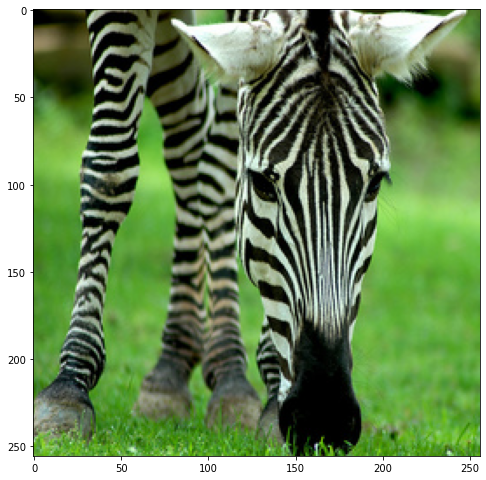

In [ ]:
## zebras
img_grid = torchvision.utils.make_grid(xb[:8], normalize=True)

plt.figure(figsize=(8, 24))
plt.imshow(img_grid.cpu().permute(1, 2, 0).numpy());

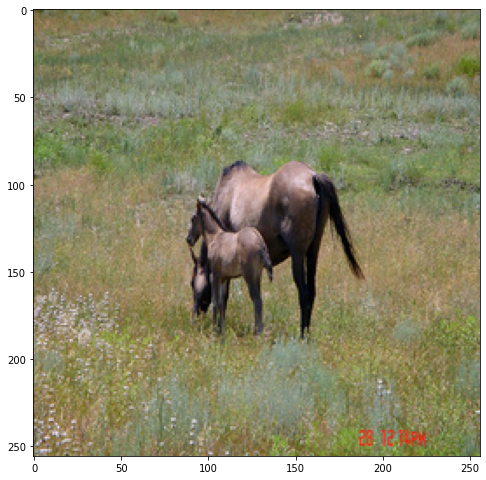

In [ ]:
## horses
img_grid = torchvision.utils.make_grid(yb[:8], normalize=True)

plt.figure(figsize=(8, 24))
plt.imshow(img_grid.cpu().permute(1, 2, 0).numpy());

Great, everything looks good. Lets now move to models

## Models

**Note:** Unlike Pix2Pix, the Discriminator models are not conditioned in CycleGANs. Only the Generator models are conditioned. 

In CycleGANs, the Discriminator is a PatchGAN (same as pix2pix)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()

        self.model = nn.Sequential(
            self.get_convblock(in_channels, 64, ks=4, stride=2, norm=False),
            self.get_convblock(64, 128, ks=4, stride=2),
            self.get_convblock(128, 256, ks=4, stride=2),
            self.get_convblock(256, 512, ks=4, stride=2),
            self.get_convblock(512, 512, ks=4, stride=1),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect")
        )

    def get_convblock(self, in_channels, out_channels, ks, stride, norm=True):
        layers = []
        layers.append(nn.Conv2d(in_channels, out_channels, 
                                kernel_size = ks, stride = stride,
                                padding=1, padding_mode = "reflect")
                )
        if norm : layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [ ]:
netD = Discriminator(3)
netD

Discriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
      (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
      (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
      (1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    

lets try passing one batch of data and look at the shape of the output tensor. 

In [ ]:
netD(xb).shape

torch.Size([1, 1, 14, 14])

**Note:** According to the paper, the output should be 16 x 16. For some reason, I am not able to get the same. I spend some time investigating it but was unsuccessful. Maybe I will try again sometime later.

### Generator Model

The generator model is again very simple to implement. Its just some **ConvBlocks** followed by some **residual blocks** and then some **TransposeConvBlocks**

I shamelessly copied the code from the following repo and make some tweaks to make it work.

In [ ]:
# source: https://github.com/aladdinpersson/Machine-Learning-Collection/blob/master/ML/Pytorch/GANs/CycleGAN/generator_model.py

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 64, num_residuals=9):
        super().__init__()
        self.initial = ConvBlock(img_channels, num_features, down=False, kernel_size=7, stride=1, padding=3)
        
        self.down_blocks = nn.Sequential(
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.Sequential(
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
        )

        self.last = nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        x = self.initial(x)
        x = self.down_blocks(x)
        x = self.res_blocks(x)
        x = self.up_blocks(x)
        x = self.last(x)
        return torch.tanh(x)

In [ ]:
netG = Generator(3)
netG(xb).shape

torch.Size([1, 3, 256, 256])

Now that we have the definations for both the Generator model as well as the Discriminator model we can define both our models

In [ ]:
gen_HZ = Generator(IMG_CHANNELS).to(DEVICE) # Generator : Horse to Zebra
gen_ZH = Generator(IMG_CHANNELS).to(DEVICE) # Generator : Zebra to Horse
dis_H = Discriminator(IMG_CHANNELS).to(DEVICE) # Discriminator : Horse
dis_Z = Discriminator(IMG_CHANNELS).to(DEVICE) # Discriminator : Zebra

One last thing before we can write the training loop: Loss and optimizers. We will be using `L1Loss` and `MSELoss`.  

In [ ]:
## Loss & Optimizer
l1 = nn.L1Loss()
mse = nn.MSELoss()

opt_dis = torch.optim.Adam(list(dis_H.parameters()) + list(dis_Z.parameters()), lr=LR, betas=(0.5, 0.999))
opt_gen = torch.optim.Adam(list(gen_HZ.parameters()) + list(gen_ZH.parameters()), lr=LR, betas=(0.5, 0.999))

Finally, its time to write the training loop. I think this is the most complex part. Its very confusing, plus theres no one-to-one mapping between the code implementation and the theory in paper. 

To me, going through the code and implementing it helped a lot to understand the loop. Particularly the order in which to train the generators and the discriminators. 

We will first train the Discriminator models, just like we did in the past. Here, we have two discriminators (one for horse & one for zebra).

In the second part of the training loop, we will train the Generator models. Instead of just calculating the **Adverserial loss**, we will also calculate the **Identity loss** and **Cycle Consistency loss**. It might all sound very complex, but it will all make sense once you go through the code implementation.

In [25]:
## Training

def train(num_epochs):

    writer_horse = SummaryWriter(f"logs/horses")
    writer_zebra = SummaryWriter(f"logs/zebras")

    for epoch in range(num_epochs):
        start = time.time()
        for i, (xb, yb) in enumerate(dataloader):
            # Data
            real_Z = xb.to(DEVICE)
            real_H = yb.to(DEVICE)

            ## Train Discriminators
            fake_Z = gen_HZ(real_H)
            fake_dis = dis_Z(fake_Z.detach())
            real_dis = dis_Z(real_Z)
            fake_loss = mse(fake_dis, torch.zeros_like(fake_dis))
            real_loss = mse(real_dis, torch.ones_like(real_dis))
            loss_dis_z = fake_loss + real_loss


            fake_H = gen_ZH(real_Z)
            fake_dis = dis_H(fake_H.detach())
            real_dis = dis_H(real_H)
            fake_loss = mse(fake_dis, torch.zeros_like(fake_dis))
            real_loss = mse(real_dis, torch.ones_like(real_dis))
            loss_dis_h = fake_loss + real_loss

            loss_dis = loss_dis_h + loss_dis_z

            opt_dis.zero_grad()
            loss_dis.backward()
            opt_dis.step()

            # Training Generators

            ## Adversarial Loss
            out_dis_h = dis_H(fake_H)
            out_dis_z = dis_Z(fake_Z)
            loss_dis_h = mse(out_dis_h, torch.ones_like(out_dis_h))
            loss_dis_z = mse(out_dis_z, torch.ones_like(out_dis_z))
            loss_adver = loss_dis_h + loss_dis_z

            ## Identity Loss
            out_gen_z = gen_HZ(real_Z)
            out_gen_h = gen_ZH(real_H)
            loss_id_z = l1(out_gen_z, real_Z)
            loss_id_h = l1(out_gen_h, real_H)
            loss_id = loss_dis_h + loss_dis_z

            ## Cycle Consistency Loss
            out_gen_z = gen_HZ(fake_H)
            out_gen_h = gen_ZH(fake_Z)
            loss_cc_z = l1(out_gen_z, real_H)
            loss_cc_h = l1(out_gen_h, real_Z)
            loss_cc = loss_cc_h + loss_cc_z

            loss_gen = loss_adver + (LAMBDA_ID * loss_id) + (LAMBDA_CC * loss_cc)

            opt_gen.zero_grad()
            loss_gen.backward()
            opt_gen.step()


        print(
            f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {i}/{len(dataloader)} \
                Loss D: {loss_dis:.4f}, loss G: {loss_gen:.4f} | Time :{time.time() - start}"
        )

        with torch.no_grad():

            img_grid_H = torchvision.utils.make_grid(fake_H.cpu(), normalize=True, nrow=4)
            img_grid_Z = torchvision.utils.make_grid(fake_Z.cpu(), normalize=True, nrow=4)

            writer_horse.add_image("Fake Horses", img_grid_H, global_step=epoch)
            writer_zebra.add_image("Fake Zebra", img_grid_Z, global_step=epoch)

I will recommend that you try writing the loop on your own. You will learn a lot more and all this will start making sense.

Before we can start training our models, we will have to start the tensorboard server so that we can see how our generator models are doing.

In [23]:
## TensorBoard : starting it before training to monitor it in progress
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 202), started 1:00:43 ago. (Use '!kill 202' to kill it.)

<IPython.core.display.Javascript object>

In [26]:
train(5)

Epoch [0/5] Batch 1333/1334                 Loss D: 0.7029, loss G: 10.8809 | Time :723.0625886917114
Epoch [1/5] Batch 1333/1334                 Loss D: 0.5754, loss G: 9.8553 | Time :722.9564146995544
Epoch [2/5] Batch 1333/1334                 Loss D: 0.9685, loss G: 7.2282 | Time :722.7179851531982
Epoch [3/5] Batch 1333/1334                 Loss D: 0.9229, loss G: 10.2666 | Time :722.656286239624
Epoch [4/5] Batch 1333/1334                 Loss D: 0.5435, loss G: 11.9760 | Time :722.6480922698975


Because of GPU limitation, I have only trained it for 5 epochs. But you can train the models for much longer to get even better results.

I will write a helper function to help us generate some samples to look at. 

In [39]:
a = torch.randn(1, 3, 24, 24)
b = torch.randn(1, 3, 24, 24)
torch.concat([a,b]).shape

torch.Size([2, 3, 24, 24])

In [40]:
def generate(n_samples = 4):
    xb, yb = next(iter(dataloader))
    # xb, yb = xb[:n_samples], yb[:n_samples]
    fake_Z = gen_HZ(xb.to(DEVICE))
    fake_H = gen_ZH(yb.to(DEVICE))
    horse = torch.concat([xb.cpu(), fake_Z.cpu()])
    zebra = torch.concat([yb.cpu(), fake_H.cpu()])
    img_grid_horse = torchvision.utils.make_grid(horse, normalize=True, nrow=2)
    img_grid_zebra = torchvision.utils.make_grid(zebra, normalize=True, nrow=2)

    plt.figure(figsize=(8, 4))
    plt.imshow(img_grid_horse.cpu().permute(1, 2, 0).numpy());
    plt.figure(figsize=(8, 4))
    plt.imshow(img_grid_zebra.cpu().permute(1, 2, 0).numpy());

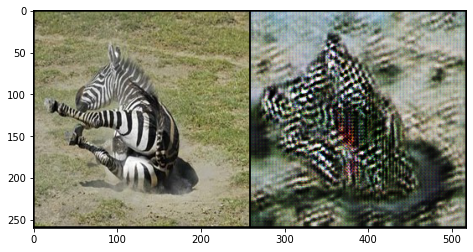

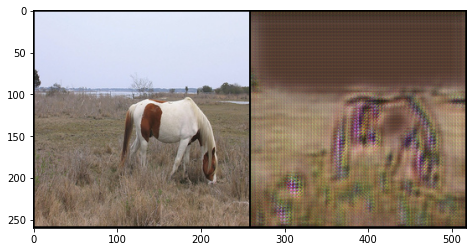

In [41]:
generate()
# zebra real - horse fake
# horse real - zebra fake

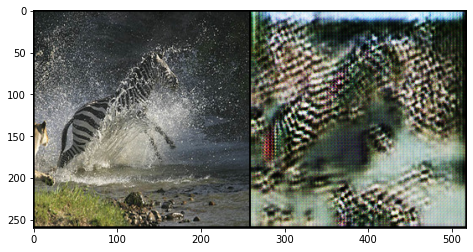

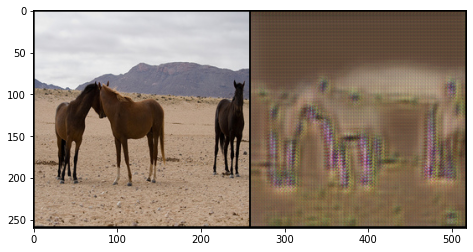

In [42]:
generate()

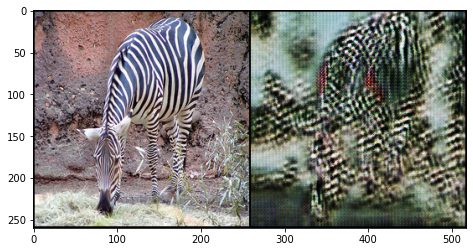

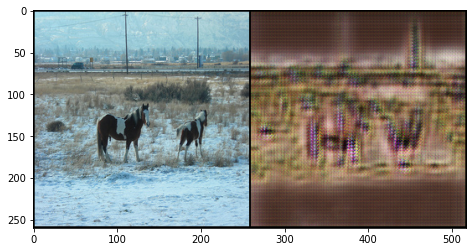

In [43]:
generate()

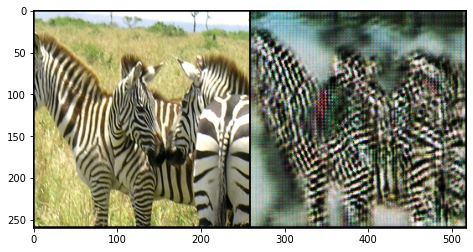

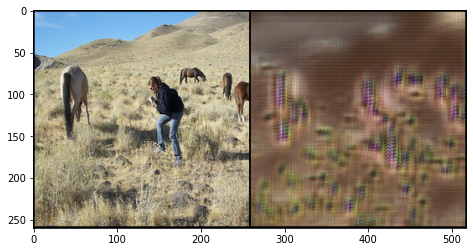

In [44]:
generate()

And that brings us to the end of the notebook. CycleGANs are famous for generating a lot of cool images, there are many other unpaired images in the dataset that we downloaded from kaggle. I think you should give them a try. Just update the `root_zebra` and `root_horse` paths and you are good to go. 

See you all in the next one . . .